In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
df = pd.read_csv('heart_attack_south_africa.csv')

In [5]:
%pip install plotly

   ---------------------------------------- 0.0/9.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/9.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/9.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/9.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/9.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/9.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/9.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/9.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/9.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/9.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/9.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/9.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/9.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/9.9 MB ? eta -:--:--
   -------------------------------


[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [6]:
               # 1
# Use the Heart_Attack_Outcome to determine marker colors
#  (e.g., 0 = no heart attack, 1 = heart attack).

import plotly.express as px

# 3D Scatter Plot
fig = px.scatter_3d(
    df,
    x="Age",
    y="Cholesterol_Level",
    z="Blood_Pressure_Systolic",
    color="Heart_Attack_Outcome",   # 0 = No, 1 = Yes
    color_continuous_scale=["green", "red"],  # Green = No heart attack, Red = Heart attack
    opacity=0.7,
    title="3D Scatter Plot of Heart Attack Risk Factors"
)

fig.show()


In [7]:
#                           2
# Include hover text that shows additional details 
# (e.g., Gender, Diabetes_Status, Obesity_Index).

fig = px.scatter_3d(
    df,
    x="Age",
    y="Cholesterol_Level",
    z="Blood_Pressure_Systolic",
    color="Heart_Attack_Outcome",
    color_continuous_scale=["green", "red"],
    opacity=0.7,
    hover_data=["Gender", "Diabetes_Status", "Obesity_Index"],  # shows extra info
    title="3D Scatter Plot with Heart Attack Details"
)

fig.show()


In [12]:
#                       3
# 3D Surface Plot of Predicted Heart Attack Risk

import plotly.graph_objects as go

# Create a grid for Age and Cholesterol
age_range = np.linspace(df["Age"].min(), df["Age"].max(), 50)
chol_range = np.linspace(df["Cholesterol_Level"].min(), df["Cholesterol_Level"].max(), 50)
age_grid, chol_grid = np.meshgrid(age_range, chol_range)

# Example formula (replace with model output if available)
risk_surface = 0.3 * age_grid + 0.5 * chol_grid + np.random.randn(*age_grid.shape) * 5

# Create the 3D surface plot
fig = go.Figure(data=[go.Surface(
    x=age_grid,
    y=chol_grid,
    z=risk_surface,
    colorscale="Reds"
)])

fig.update_layout(
    title="3D Surface Plot of Predicted Heart Attack Risk",
    scene=dict(
        xaxis_title="Age",
        yaxis_title="Cholesterol Level",
        zaxis_title="Predicted Risk"
    )
)

fig.show()


In [4]:
df.head()

,Patient_ID,Age,Gender,Cholesterol_Level,Blood_Pressure_Systolic,Blood_Pressure_Diastolic,Smoking_Status,Alcohol_Intake,Physical_Activity,Obesity_Index,Diabetes_Status,Family_History_Heart_Disease,Diet_Quality,Stress_Level,Heart_Attack_History,Medication_Usage,Triglycerides_Level,LDL_Level,HDL_Level,Heart_Attack_Outcome
0,1,76,Female,156,94,79,No,High,Sedentary,35.2,No,No,Good,High,No,No,264,141,65,0
1,2,39,Female,160,185,88,No,Low,Sedentary,21.3,No,No,Average,Medium,No,Yes,150,81,42,0
2,3,85,Male,254,173,113,Yes,Moderate,Highly Active,32.0,Yes,No,Good,Low,No,No,220,124,70,1
3,4,45,Female,261,187,65,No,High,Sedentary,36.4,No,Yes,Average,Low,No,Yes,141,56,38,1
4,5,48,Male,206,189,84,No,Low,Active,26.6,No,No,Good,High,No,No,221,186,26,0


# Model Development:

In [8]:
# Build a Logistic Regression Model using Age and Cholesterol_Level

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

# Select the features and target
X = df[['Age', 'Cholesterol_Level']]     # features
y = df['Heart_Attack_Outcome']           # target

# Create the logistic regression model
model = LogisticRegression()



In [9]:
# Split the data into training and testing parts
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train (fit) the model
model.fit(X_train, y_train)


,penalty,'l2'
,dual,False
,tol,0.0001
,C,1.0
,fit_intercept,True
,intercept_scaling,1
,class_weight,None
,random_state,None
,solver,'lbfgs'
,max_iter,100
,multi_class,'deprecated'


# Surface Plot Construction

In [ ]:
# 1
import numpy as np

# Create a range for Age and Cholesterol_Level
age_range = np.linspace(df['Age'].min(), df['Age'].max(), 100)
chol_range = np.linspace(df['Cholesterol_Level'].min(), df['Cholesterol_Level'].max(), 100)

# Create a meshgrid (a grid of Age vs Cholesterol)
age_grid, chol_grid = np.meshgrid(age_range, chol_range)



In [ ]:
# Q2
# Combine the grid into a single input for prediction
grid_points = np.c_[age_grid.ravel(), chol_grid.ravel()]

# Predict probabilities using the trained model
probabilities = model.predict_proba(grid_points)[:, 1]  # Probability of heart attack (1)

# Reshape back to grid shape for visualization
risk_surface = probabilities.reshape(age_grid.shape)


c:\Users\HP\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


In [13]:
# Q3

fig = go.Figure(data=[go.Surface(
    x=age_grid,
    y=chol_grid,
    z=risk_surface,
    colorscale='RdYlBu_r',
    colorbar=dict(title="Heart Attack Risk"),
)])

fig.update_layout(
    title="Predicted Heart Attack Risk Surface",
    scene=dict(
        xaxis_title="Age",
        yaxis_title="Cholesterol Level",
        zaxis_title="Risk Probability"
    ),
    height=600
)

fig.show()


# Data Preparation

In [17]:
# Q1

# Create a grid of values
age_range = np.linspace(df["Age"].min(), df["Age"].max(), 100)
chol_range = np.linspace(df["Cholesterol_Level"].min(), df["Cholesterol_Level"].max(), 100)

Age_grid, Chol_grid = np.meshgrid(age_range, chol_range)



In [18]:
# Q2
# Flatten the grid and make predictions
X_grid = np.c_[Age_grid.ravel(), Chol_grid.ravel()]
risk_probs = model.predict_proba(X_grid)[:, 1]  # Probability of heart attack (1)

# Reshape back to grid shape
Risk_surface = risk_probs.reshape(Age_grid.shape)


c:\Users\HP\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning:

X does not have valid feature names, but LogisticRegression was fitted with feature names



In [19]:
# Q3

fig = go.Figure(data=[go.Surface(
    x=Age_grid,
    y=Chol_grid,
    z=Risk_surface,
    colorscale='RdYlGn_r',
    colorbar_title='Heart Attack Risk'
)])

fig.update_layout(
    title="3D Surface of Predicted Heart Attack Risk",
    scene=dict(
        xaxis_title='Age',
        yaxis_title='Cholesterol Level',
        zaxis_title='Risk Probability'
    )
)

fig.show()


# Clustering

In [21]:
# Q1
from sklearn.cluster import KMeans

# Select key features for clustering
X_cluster = df[["Age", "Cholesterol_Level", "Blood_Pressure_Systolic", "Obesity_Index"]]

# Initialize K-Means with 3 clusters
kmeans = KMeans(n_clusters=3, random_state=42)
df["Cluster"] = kmeans.fit_predict(X_cluster)


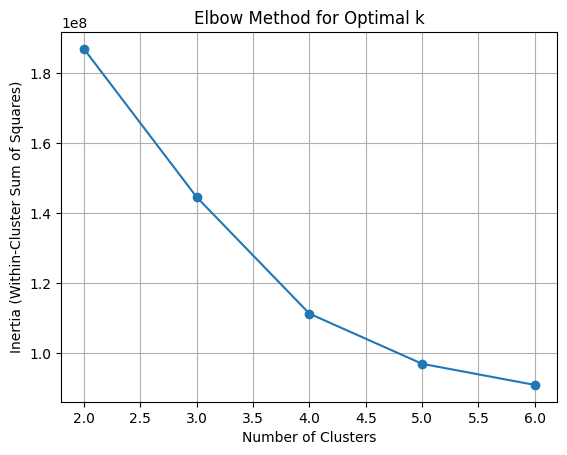

In [22]:
# Q2

inertias = []

# Test different cluster counts
for k in range(2, 7):
    km = KMeans(n_clusters=k, random_state=42)
    km.fit(X_cluster)
    inertias.append(km.inertia_)

# Plot to find the "elbow" point
import matplotlib.pyplot as plt

plt.plot(range(2, 7), inertias, marker='o')
plt.title("Elbow Method for Optimal k")
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia (Within-Cluster Sum of Squares)")
plt.grid(True)
plt.show()


# 3D Visualization

In [23]:
# Q1

# 3D scatter plot of clusters
fig = go.Figure()

for cluster_id in df['Cluster'].unique():
    cluster_data = df[df['Cluster'] == cluster_id]
    fig.add_trace(go.Scatter3d(
        x=cluster_data['Age'],
        y=cluster_data['Cholesterol_Level'],
        z=cluster_data['Blood_Pressure_Systolic'],
        mode='markers',
        marker=dict(size=5),
        name=f'Cluster {cluster_id}',
        hovertext=cluster_data[['Patient_ID', 'Obesity_Index', 'Diabetes_Status']].astype(str).agg(', '.join, axis=1)
    ))

fig.update_layout(
    scene=dict(
        xaxis_title='Age',
        yaxis_title='Cholesterol Level',
        zaxis_title='Blood Pressure Systolic'
    ),
    title='3D Scatter Plot of Patient Clusters'
)

fig.show()


In [24]:
# Q2
hovertext=cluster_data[['Patient_ID', 'Obesity_Index', 'Diabetes_Status']].astype(str).agg(', '.join, axis=1)


In [ ]:
%pip install dash


In [30]:
# Q3
# Include a slider or dropdown 
# to adjust the number of clusters dynamically (Dash example)
# Dash example
from dash import Dash, dcc, html, Input, Output

app = Dash(__name__)

app.layout = html.Div([
    html.H2("Interactive 3D Clustering"),
    dcc.Slider(
        id='cluster-slider',
        min=2, max=6, step=1,
        value=3,
        marks={i: str(i) for i in range(2, 7)}
    ),
    dcc.Graph(id='cluster-3d-plot')
])

@app.callback(
    Output('cluster-3d-plot', 'figure'),
    Input('cluster-slider', 'value')
)
def update_clusters(n_clusters):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    df['Cluster'] = kmeans.fit_predict(X_cluster)
    
    fig = go.Figure()
    for cluster_id in df['Cluster'].unique():
        cluster_data = df[df['Cluster'] == cluster_id]
        fig.add_trace(go.Scatter3d(
            x=cluster_data['Age'],
            y=cluster_data['Cholesterol_Level'],
            z=cluster_data['Blood_Pressure_Systolic'],
            mode='markers',
            marker=dict(size=5),
            name=f'Cluster {cluster_id}',
            hovertext=cluster_data[['Patient_ID', 'Obesity_Index', 'Diabetes_Status']].astype(str).agg(', '.join, axis=1)
        ))
    fig.update_layout(
        scene=dict(
            xaxis_title='Age',
            yaxis_title='Cholesterol Level',
            zaxis_title='Blood Pressure Systolic'
        ),
        title=f'3D Scatter Plot with {n_clusters} Clusters'
    )
    return fig

if __name__ == '__main__':
    app.run(debug=True)


# Visualization Integration (Bar Chart)

In [40]:
# Q1

# Example DataFrame
# df = pd.read_csv("your_dataset.csv")

# Initialize Dash app
app = Dash(__name__)

# Layout
app.layout = html.Div([
    html.H2("Heart Attack Outcome Dashboard"),
    
    # Filter example: Age range slider
    html.Label("Select Age Range:"),
    dcc.RangeSlider(
        id='age-slider',
        min=int(df['Age'].min()),
        max=int(df['Age'].max()),
        value=[int(df['Age'].min()), int(df['Age'].max())],
        marks={i: str(i) for i in range(int(df['Age'].min()), int(df['Age'].max())+1, 10)},
        step=1
    ),
    
    # Bar chart
    dcc.Graph(id='heart-attack-bar'),
    
    # Download button
    html.Button("Download Filtered CSV", id="download-btn"),
    dcc.Download(id="download-dataframe-csv")
])




In [41]:
@app.callback(
    Output("download-dataframe-csv", "data"),
    Input("download-btn", "n_clicks"),
    Input('age-slider', 'value'),
    prevent_initial_call=True
)
def download_filtered_data(n_clicks, age_range):
    # Filter the data based on slider
    filtered_df = df[(df['Age'] >= age_range[0]) & (df['Age'] <= age_range[1])]
    
    # Send filtered dataframe as CSV
    return dcc.send_data_frame(filtered_df.to_csv, "filtered_heart_attack_data.csv", index=False)


In [42]:
if __name__ == '__main__':
    app.run(debug=True)  # For Dash 3.x
